In [ ]:
import os
from google.colab import files

# Upload the RAR file
uploaded = files.upload()

# Get the uploaded RAR file name
rar_filename = list(uploaded.keys())[0]

# Install unrar (needed to extract .rar files)
!apt-get install unrar

# Create a folder to extract images
output_folder = "/content/images"
os.makedirs(output_folder, exist_ok=True)

# Extract the RAR file
!unrar x -o+ "{rar_filename}" "{output_folder}/"

# Get a list of extracted image files (PNG, JPG, JPEG)
image_files = sorted([f for f in os.listdir(output_folder) if f.endswith(('.png', '.jpg', '.jpeg'))])

# Print extracted images
print("Extracted Images:")
for img in image_files:
    print(img)

Saving Cats.rar to Cats.rar
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1).
0 upgraded, 0 newly installed, 0 to remove and 18 not upgraded.

UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from Cats.rar

Extracting  /content/images/11.jpg                                         3%  6%  OK 
Extracting  /content/images/12.jpg                                        10%  OK 
Extracting  /content/images/13.jpg                                        14% 17%  OK 
Extracting  /content/images/14.jpg                                        21% 25%  OK 
Extracting  /content/images/15.jpg                                        28% 32% 36%  OK 
Extracting  /content/images/16.jpg                                        55%  OK 
Extracting  /content/images/17.jpg                                  

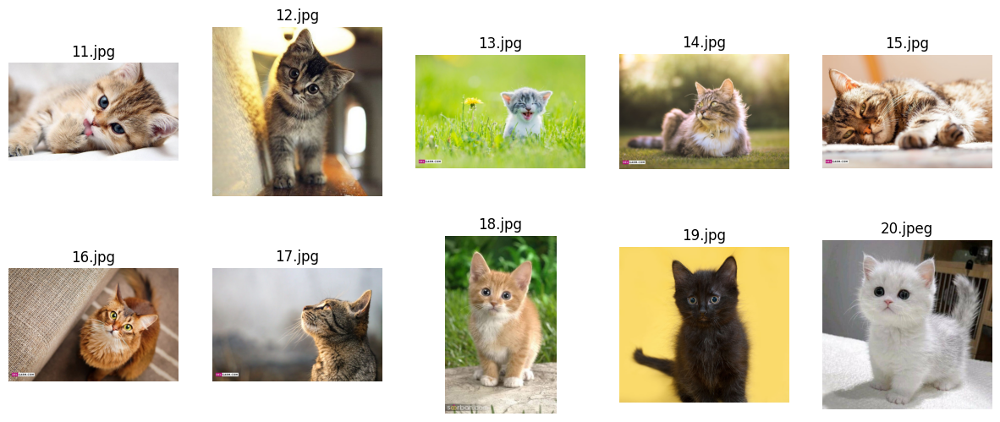

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Path to extracted images
output_folder = "/content/images"

# Get a list of extracted images
image_files = sorted([f for f in os.listdir(output_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Number of images per row
cols = 5
rows = (len(image_files) + cols - 1) // cols

plt.figure(figsize=(15, rows * 3))

for i, img_name in enumerate(image_files):
    img_path = os.path.join(output_folder, img_name)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# print images
    plt.subplot(rows, cols, i + 1)
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"{img_name}")

plt.show()

# GrabCut ALGORITHM

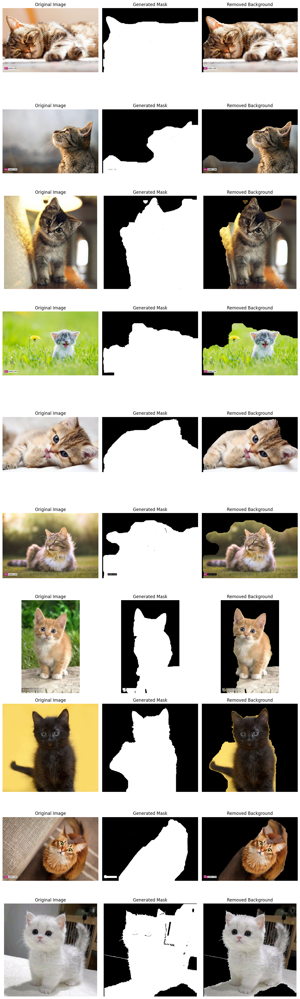

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

# Function to perform GrabCut segmentation
def grabcut_segmentation(image):
    # Convert to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Initial mask
    mask = np.zeros(image.shape[:2], np.uint8)

    # Background and foreground models
    background_model = np.zeros((1, 65), np.float64)
    foreground_model = np.zeros((1, 65), np.float64)

    # Define initial rectangle for GrabCut
    rect = (10, 10, image.shape[1] - 10, image.shape[0] - 10)

    # Apply GrabCut algorithm
    cv2.grabCut(image, mask, rect, background_model, foreground_model, 5, cv2.GC_INIT_WITH_RECT)

    # Final mask: 0 and 2 are background, 1 and 3 are foreground
    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

    return mask2

# Extracted images folder
image_folder = "/content/images"
image_paths = []
for ext in ["*.png", "*.jpg", "*.jpeg"]:
    image_paths.extend(glob.glob(os.path.join(image_folder, ext)))

if not image_paths:
    print("No images found in the folder.")
else:
  # Set up figure for displaying images
    fig, axes = plt.subplots(len(image_paths), 3, figsize=(12, 4 * len(image_paths)))

# Process each image
for idx, image_path in enumerate(image_paths):
    # Load image
    image = cv2.imread(image_path)

    # Apply GrabCut segmentation
    mask = grabcut_segmentation(image)

    # Create an all-black background
    background = np.zeros_like(image)

    # Mask the image (keep only the foreground where mask is 1)
    foreground = cv2.bitwise_and(image, image, mask=mask)

    # Combine the foreground with the black background
    result = cv2.add(foreground, background)

    # Display original image
    axes[idx, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[idx, 0].set_title("Original Image")
    axes[idx, 0].axis("off")

    # Display mask
    axes[idx, 1].imshow(mask, cmap="gray")
    axes[idx, 1].set_title("Generated Mask")
    axes[idx, 1].axis("off")

    # Display final result
    axes[idx, 2].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    axes[idx, 2].set_title("Removed Background")
    axes[idx, 2].axis("off")

plt.tight_layout()
plt.show()

# DeepLabV3 MODEL

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.6.0


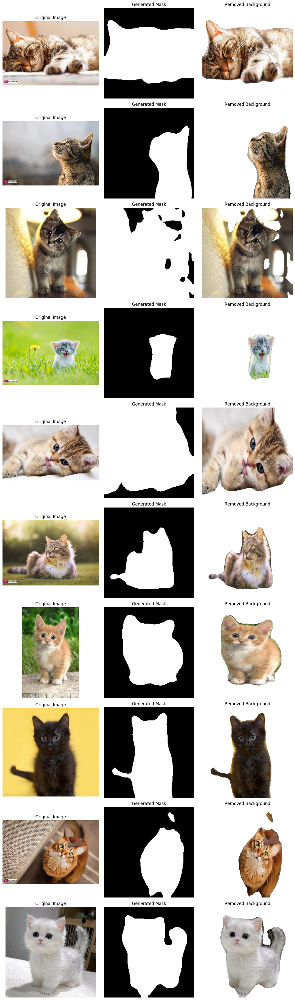

In [ ]:
import torch
import numpy as np
import cv2
from PIL import Image
from torchvision import transforms
from google.colab import files
from matplotlib import pyplot as plt
import os
import glob

# Load the DeepLabV3 model from PyTorch Hub
def load_model():
    model = torch.hub.load('pytorch/vision:v0.6.0', 'deeplabv3_resnet101', pretrained=True)
    # Set the model to evaluation mode
    model.eval()
    return model

# Preprocess the image (resize, convert to RGB, normalize)
def preprocess_image(image, target_size=(224, 224)):
    # Resize image to the target size (standard size for DeepLabV3)
    image_resized = cv2.resize(image, target_size)

    # Convert BGR image to RGB
    image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)

    # Convert image to PIL format
    pil_image = Image.fromarray(image_rgb)

    return pil_image

# Function to create a transparent foreground using the predicted mask
def make_transparent_foreground(pic, mask):
    # Split the image into channels
    b, g, r = cv2.split(np.array(pic).astype('uint8'))

    # Add an alpha channel with transparency (255 means fully opaque)
    a = np.ones(mask.shape, dtype='uint8') * 255

    # Merge the channels with the alpha channel to create an RGBA image
    alpha_im = cv2.merge([b, g, r, a], 4)

    # Create a background filled with zeros (black)
    bg = np.zeros(alpha_im.shape)

    # Set up a new mask
    new_mask = np.stack([mask, mask, mask, mask], axis=2)

    # Copy only the foreground pixels from the original image where mask is 1
    foreground = np.where(new_mask, alpha_im, bg).astype(np.uint8)

    return foreground

# Function to remove the background using DeepLabV3 model
def remove_background(model, input_image):
    preprocess = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    input_tensor = preprocess(input_image)
    # Add a batch dimension
    input_batch = input_tensor.unsqueeze(0)

    # Move the input and model to GPU if available
    if torch.cuda.is_available():
        input_batch = input_batch.to('cuda')
        model.to('cuda')

    with torch.no_grad():
        output = model(input_batch)['out'][0]

    output_predictions = output.argmax(0)

    # Create a binary mask where 1 represents the foreground and 0 represents the background
    mask = output_predictions.byte().cpu().numpy()
    background = np.zeros(mask.shape)
    bin_mask = np.where(mask, 255, background).astype(np.uint8)

    # Make the foreground transparent
    foreground = make_transparent_foreground(input_image, bin_mask)

    return foreground, bin_mask

# Folder where images are stored
image_folder = "/content/images"
image_paths = []
for ext in ["*.png", "*.jpg", "*.jpeg"]:
    image_paths.extend(glob.glob(os.path.join(image_folder, ext)))

if not image_paths:
    print("No images found in the folder.")
else:
  # Set up figure for displaying images
    fig, axes = plt.subplots(len(image_paths), 3, figsize=(12, 4 * len(image_paths)))

# Load the DeepLabV3 model
deeplab_model = load_model()

# Process each image
for idx, image_path in enumerate(image_paths):
    # Load image using OpenCV
    image = cv2.imread(image_path)

    # Preprocess the image
    input_image = preprocess_image(image)

    # Remove the background
    foreground, bin_mask = remove_background(deeplab_model, input_image)

    # Display original image
    axes[idx, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[idx, 0].set_title("Original Image")
    axes[idx, 0].axis("off")

    # Display mask
    axes[idx, 1].imshow(bin_mask, cmap="gray")
    axes[idx, 1].set_title("Generated Mask")
    axes[idx, 1].axis("off")

    # Display final result
    axes[idx, 2].imshow(foreground)
    axes[idx, 2].set_title("Removed Background")
    axes[idx, 2].axis("off")

plt.tight_layout()
plt.show()

# MODNET MODEL

In [ ]:
import os

# clone the repository
%cd /content
if not os.path.exists('MODNet'):
  !git clone https://github.com/ZHKKKe/MODNet
%cd MODNet/

# dowload the pre-trained ckpt for image matting
pretrained_ckpt = 'pretrained/modnet_photographic_portrait_matting.ckpt'
if not os.path.exists(pretrained_ckpt):
  !gdown --id 1mcr7ALciuAsHCpLnrtG_eop5-EYhbCmz \
          -O pretrained/modnet_photographic_portrait_matting.ckpt

/content
/content/MODNet
/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1mcr7ALciuAsHCpLnrtG_eop5-EYhbCmz
To: /content/MODNet/pretrained/modnet_photographic_portrait_matting.ckpt
100% 26.3M/26.3M [00:00<00:00, 158MB/s]


/content/MODNet/demo/image_matting/colab/inference.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  weights = torch.load(args.ckpt_path, map_location=torch.device('cpu')

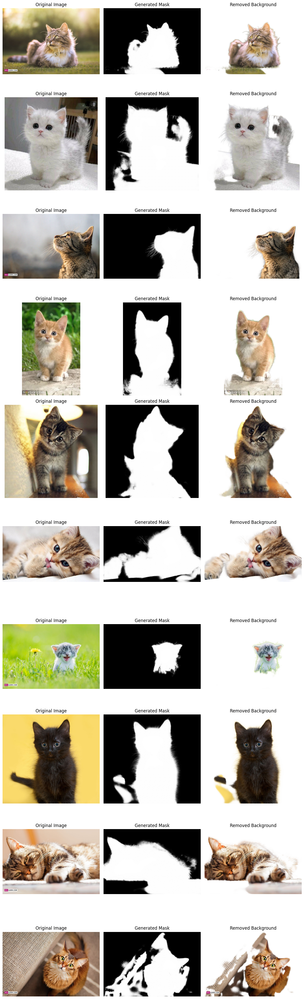

In [ ]:
import shutil
import os
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# copy images to MODNET folder
source_file = '/content/images'
input_folder = 'demo/image_matting/colab/input'
if os.path.exists(input_folder):
  shutil.rmtree(input_folder)
shutil.copytree(source_file, input_folder)

# output folder
output_folder = 'demo/image_matting/colab/output'
if os.path.exists(output_folder):
  shutil.rmtree(output_folder)
os.makedirs(output_folder)

# use MODNET model
!python -m demo.image_matting.colab.inference \
        --input-path demo/image_matting/colab/input \  # Path to the input images folder
        --output-path demo/image_matting/colab/output \  # Path where the output images will be saved
        --ckpt-path ./pretrained/modnet_photographic_portrait_matting.ckpt  # Path to the pre-trained MODNet checkpoint file

# Function to display the result with the background removed
def display_removed_background(image, matte):
    # obtain predicted foreground
    image = np.asarray(image)
    if len(image.shape) == 2:
        image = image[:, :, None]
    if image.shape[2] == 1:
        image = np.repeat(image, 3, axis=2)
    elif image.shape[2] == 4:
        image = image[:, :, 0:3]

    matte = np.repeat(np.asarray(matte)[:, :, None], 3, axis=2) / 255
    foreground = image * matte + np.full(image.shape, 255) * (1 - matte)

    # Show the resulting image with background removed
    result = Image.fromarray(np.uint8(foreground))
    return result

# Load image paths
image_names = os.listdir(input_folder)
image_paths = [os.path.join(input_folder, image_name) for image_name in image_names if image_name.endswith(('.jpg', '.jpeg', '.png'))]

# Initialize plot axes
fig, axes = plt.subplots(len(image_paths), 3, figsize=(12, 4 * len(image_paths)))

# Process each image
for idx, image_path in enumerate(image_paths):
    image_name = os.path.basename(image_path)
    matte_name = image_name.split('.')[0] + '.png'

    image = Image.open(image_path)
    matte = Image.open(os.path.join(output_folder, matte_name))

    # Remove background
    result2 = display_removed_background(image, matte)

    # Display images
    axes[idx, 0].imshow(image)
    axes[idx, 0].set_title("Original Image")
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(np.asarray(matte), cmap="gray")
    axes[idx, 1].set_title("Generated Mask")
    axes[idx, 1].axis("off")

    axes[idx, 2].imshow(np.asarray(result2))
    axes[idx, 2].set_title("Removed Background")
    axes[idx, 2].axis("off")

plt.tight_layout()
plt.show()